# The Battle of Neighborhood

## Problem Description

New York is a famous destination for people around the world. There are millions of tourists visit this island each year. The popular land marks that attracted people all over the world are such as Liberty Statue, 911 Memorial, Times Square or Empire State Building.

Not only those land mark but New York is also popular about coffee shop & restaurant. There are many good variety coffee shops & restaurants in this small city. Thus if you are a new entrepreneur that want to open a new coffee shop in New York it will be very challenging as there are high competitive as well as high demanding. The location is an important factor to become success or failed in this business.

## Business Problem 
Which borough and neighborhood is the best place to open the new coffee shop in New York City?

## Data
1. Foursquare location data will be used to identify the location to open the new coffee shop in New York City such as
     - Neighborhood Location
     - Venue location
     - Venue Category
2. QuickFacts of New York city, New York; Bronx County (Bronx Borough), New York; Kings County (Brooklyn Borough), New York; New York County (Manhattan Borough), New York; Queens County (Queens Borough), New York; Richmond County (Staten Island Borough), New York
     https://www.census.gov/quickfacts/fact/table/newyorkcitynewyork,bronxcountybronxboroughnewyork,kingscountybrooklynboroughnewyork,newyorkcountymanhattanboroughnewyork,queenscountyqueensboroughnewyork,richmondcountystatenislandboroughnewyork/PST045219\n

In [6]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
#pd.set_option('display.max_columns', 500)
#pd.set_option('display.max_rows', 500)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.8.3
  latest version: 4.8.4

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.8.3
  latest version: 4.8.4

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.

Libraries imported.


In [7]:
#Get New York data set
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
print('Data downloaded!')
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

Data downloaded!


In [8]:
neighborhoods_data = newyork_data['features']
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

In [9]:
#Transfrom to pandas data frame
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [10]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude


In [11]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
    
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
        
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [12]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [13]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [14]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [15]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

In [16]:
#Get Foursquare

CLIENT_ID = 'OGEO1N214LTVJY3202T5DIF2TYHVD1FTYCBJLG2ZLTSRYWEU' # your Foursquare ID
CLIENT_SECRET = 'YBPGQFTHMK4GY4FUVNHOZJH3ADCY1DCDE2J3OAENZWXJINJI' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: OGEO1N214LTVJY3202T5DIF2TYHVD1FTYCBJLG2ZLTSRYWEU
CLIENT_SECRET:YBPGQFTHMK4GY4FUVNHOZJH3ADCY1DCDE2J3OAENZWXJINJI


In [17]:
def getNearbyVenues(borough, names, latitudes, longitudes, radius=500):
    LIMIT=100
    venues_list=[]
    for borough, name, lat, lng in zip(borough, names, latitudes, longitudes):
        print(borough, name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            borough,
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Borough',
                  'Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [24]:
newyork_venues = getNearbyVenues(borough=neighborhoods['Borough'],
                                   names=neighborhoods['Neighborhood'],
                                   latitudes=neighborhoods['Latitude'],
                                   longitudes=neighborhoods['Longitude']
                                  )

Bronx Wakefield
Bronx Co-op City
Bronx Eastchester
Bronx Fieldston
Bronx Riverdale
Bronx Kingsbridge
Manhattan Marble Hill
Bronx Woodlawn
Bronx Norwood
Bronx Williamsbridge
Bronx Baychester
Bronx Pelham Parkway
Bronx City Island
Bronx Bedford Park
Bronx University Heights
Bronx Morris Heights
Bronx Fordham
Bronx East Tremont
Bronx West Farms
Bronx High  Bridge
Bronx Melrose
Bronx Mott Haven
Bronx Port Morris
Bronx Longwood
Bronx Hunts Point
Bronx Morrisania
Bronx Soundview
Bronx Clason Point
Bronx Throgs Neck
Bronx Country Club
Bronx Parkchester
Bronx Westchester Square
Bronx Van Nest
Bronx Morris Park
Bronx Belmont
Bronx Spuyten Duyvil
Bronx North Riverdale
Bronx Pelham Bay
Bronx Schuylerville
Bronx Edgewater Park
Bronx Castle Hill
Bronx Olinville
Bronx Pelham Gardens
Bronx Concourse
Bronx Unionport
Bronx Edenwald
Brooklyn Bay Ridge
Brooklyn Bensonhurst
Brooklyn Sunset Park
Brooklyn Greenpoint
Brooklyn Gravesend
Brooklyn Brighton Beach
Brooklyn Sheepshead Bay
Brooklyn Manhattan Terrac

KeyError: 'groups'

In [19]:
newyork_venues=pd.read_csv('newyork_venues.csv')

In [20]:
newyork_venues.shape

(10073, 8)

In [21]:
#print(newyork_venues.groupby(['Borough']).count())
ny_neighborhood_count = newyork_venues.groupby(['Borough']).count()

In [22]:
ny_neighborhood_count.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Borough,,,,,,,
Bronx,1218,1218,1218,1218,1218,1218,1218
Brooklyn,2763,2763,2763,2763,2763,2763,2763
Manhattan,3177,3177,3177,3177,3177,3177,3177
Queens,2083,2083,2083,2083,2083,2083,2083
Staten Island,832,832,832,832,832,832,832


In [23]:
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot') # optional: for ggplot-like style

# check for latest version of Matplotlib
print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0

Matplotlib version:  3.3.0


In [24]:
print (mpl.rcParams['backend'])

module://ipykernel.pylab.backend_inline


In [26]:
ny_neighborhood_count.drop(['Neighborhood Latitude','Neighborhood Longitude','Venue','Venue Latitude','Venue Longitude','Venue Category'],axis=1,inplace=True)
ny_neighborhood_count.head()

,Neighborhood
Borough,
Bronx,1218
Brooklyn,2763
Manhattan,3177
Queens,2083
Staten Island,832


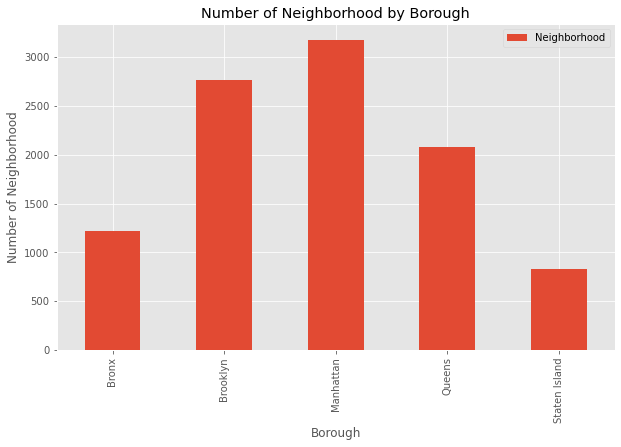

In [27]:
ny_neighborhood_count.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Borough')
plt.ylabel('Number of Neighborhood')
plt.title('Number of Neighborhood by Borough')
plt.show()

In [28]:
newyork_onehot = pd.get_dummies(newyork_venues[['Venue Category']], prefix="", prefix_sep="")

In [29]:
newyork_onehot.drop(['Neighborhood'],axis=1,inplace=True)

In [30]:
newyork_onehot.head()

,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
# add neighborhood column back to dataframe

newyork_onehot['Borough']=newyork_venues['Borough']
newyork_onehot['Neighborhood'] = newyork_venues['Neighborhood'] 

In [32]:
# move neighborhood column to the first column
fixed_columns = [newyork_onehot.columns[-1]] + list(newyork_onehot.columns[:-1])
newyork_onehot = newyork_onehot[fixed_columns]
fixed_columns = [newyork_onehot.columns[-1]] + list(newyork_onehot.columns[:-1])
newyork_onehot = newyork_onehot[fixed_columns]

newyork_onehot.head()

,Borough,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Bronx,Wakefield,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Bronx,Wakefield,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Bronx,Wakefield,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Bronx,Wakefield,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Bronx,Wakefield,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
newyork_onehot.shape

(10073, 431)

In [34]:
newyork_grouped = newyork_onehot.groupby(['Borough','Neighborhood']).mean().reset_index()
newyork_grouped.head()

,Borough,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Bronx,Allerton,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
1,Bronx,Baychester,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.047619,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
2,Bronx,Bedford Park,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
3,Bronx,Belmont,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.0
4,Bronx,Bronxdale,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0


In [35]:
newyork_grouped.shape

(305, 431)

In [37]:
list(newyork_grouped.columns) 

['Borough',
 'Neighborhood',
 'Accessories Store',
 'Adult Boutique',
 'Afghan Restaurant',
 'African Restaurant',
 'Airport Terminal',
 'American Restaurant',
 'Antique Shop',
 'Arcade',
 'Arepa Restaurant',
 'Argentinian Restaurant',
 'Art Gallery',
 'Art Museum',
 'Arts & Crafts Store',
 'Arts & Entertainment',
 'Asian Restaurant',
 'Athletics & Sports',
 'Auditorium',
 'Australian Restaurant',
 'Austrian Restaurant',
 'Auto Garage',
 'Auto Workshop',
 'Automotive Shop',
 'BBQ Joint',
 'Baby Store',
 'Bagel Shop',
 'Bakery',
 'Bangladeshi Restaurant',
 'Bank',
 'Bar',
 'Baseball Field',
 'Baseball Stadium',
 'Basketball Court',
 'Bath House',
 'Beach',
 'Beach Bar',
 'Beer Bar',
 'Beer Garden',
 'Beer Store',
 'Big Box Store',
 'Bike Rental / Bike Share',
 'Bike Shop',
 'Bike Trail',
 'Bistro',
 'Board Shop',
 'Boarding House',
 'Boat or Ferry',
 'Bookstore',
 'Boutique',
 'Bowling Alley',
 'Boxing Gym',
 'Brazilian Restaurant',
 'Breakfast Spot',
 'Brewery',
 'Bridal Shop',
 'Bridg

In [38]:
newyork_grouped_clustering = newyork_grouped.drop(['Borough','Neighborhood'], 1)


In [39]:
newyork_grouped_clustering.head()

,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.047619,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0


In [40]:
# import k-means from clustering stage
from sklearn.cluster import KMeans

kclusters = 5

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(newyork_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

In [41]:
# add clustering labels
newyork_venues_clust=newyork_grouped
newyork_venues_clust.head()

,Borough,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Bronx,Allerton,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
1,Bronx,Baychester,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.047619,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
2,Bronx,Bedford Park,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
3,Bronx,Belmont,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.0
4,Bronx,Bronxdale,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0


In [42]:
newyork_venues_clust.shape

(305, 431)

In [43]:
kmeans.labels_.shape

(305,)

In [44]:
#newyork_venues_clust.drop(['Cluster Labels'], axis=1, inplace=True)
newyork_venues_clust.insert(0, 'Cluster Labels', kmeans.labels_)

In [45]:
newyork_venues_clust.head()

,Cluster Labels,Borough,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,1,Bronx,Allerton,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
1,1,Bronx,Baychester,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
2,1,Bronx,Bedford Park,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
3,1,Bronx,Belmont,0.0,0.0,0.0,0.0,0.0,0.01,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.0
4,1,Bronx,Bronxdale,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0


In [46]:
newyork_cluster=newyork_venues
newyork_venues_c = newyork_venues_clust[['Borough','Neighborhood','Cluster Labels']]
result=pd.merge(newyork_cluster,newyork_venues_c,on=['Borough','Neighborhood'])
result.head()

,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Cluster Labels
0,Bronx,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop,1
1,Bronx,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy,1
2,Bronx,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy,1
3,Bronx,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop,1
4,Bronx,Wakefield,40.894705,-73.847201,Shell,40.894187,-73.845862,Gas Station,1


In [47]:
result.groupby('Cluster Labels').count()

,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Cluster Labels,,,,,,,,
0,11,11,11,11,11,11,11,11
1,9760,9760,9760,9760,9760,9760,9760,9760
2,8,8,8,8,8,8,8,8
3,2,2,2,2,2,2,2,2
4,292,292,292,292,292,292,292,292


In [48]:
#filter only coffee shop cluster
coffeeshop_cluster=result[result['Venue Category'] == 'Coffee Shop']

In [49]:
coffeeshop_cluster.groupby('Cluster Labels').count()

,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Cluster Labels,,,,,,,,
1,312,312,312,312,312,312,312,312
4,5,5,5,5,5,5,5,5


In [50]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(result['Neighborhood Latitude'], result['Neighborhood Longitude'], result['Neighborhood'], result['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [51]:
# create map
map_coffee_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(coffeeshop_cluster['Neighborhood Latitude'], coffeeshop_cluster['Neighborhood Longitude'], coffeeshop_cluster['Neighborhood'], coffeeshop_cluster['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_coffee_clusters)
       
map_coffee_clusters

In [53]:
newyork_venues_cluster=newyork_venues_clust.copy()

In [54]:
newyork_venues_cluster.drop(['Borough','Neighborhood'],axis=1,inplace=True)
#newyork_venues_cluster.head()

In [62]:
newyork_venues_cluster.groupby('Cluster Labels')['Coffee Shop'].mean()

Cluster Labels
0    0.000000
1    0.021719
2    0.000000
3    0.000000
4    0.022672
Name: Coffee Shop, dtype: float64

In [67]:
newyork_venues_cluster.groupby('Cluster Labels')['Coffee Shop'].count()

Cluster Labels
0      3
1    268
2      2
3      2
4     30
Name: Coffee Shop, dtype: int64

In [66]:
coffeeshop_cluster.groupby(['Cluster Labels','Borough','Neighborhood']).count()

Neighborhood Latitude  \
Cluster Labels Borough       Neighborhood                               
1              Bronx         Bedford Park                           1   
                             Belmont                                2   
                             Concourse Village                      1   
                             Edgewater Park                         1   
                             Kingsbridge                            1   
...                                                               ...   
4              Brooklyn      Ocean Hill                             1   
               Queens        Briarwood                              1   
               Staten Island Arden Heights                          1   
                             Arlington                              1   
                             Park Hill                              1   

                                                Neighborhood Longitude  Venue  \
Cluster Labels Borough       Neighborhood                                       
1              Bronx         Bedford Park                            1      1   
                             Belmont                                 2      2   
                             Concourse Village                       1      1   
                             Edgewater Park                          1      1   
                             Kingsbridge                             1      1   
...                                                                ...    ...   
4              Brooklyn      Ocean Hill                              1      1   
               Queens        Briarwood                               1      1   
               Staten Island Arden Heights                           1      1   
                             Arlington                               1      1   
                             Park Hill                               1      1   

                                                Venue Latitude  \
Cluster Labels Borough       Neighborhood                        
1              Bronx         Bedford Park                    1   
                             Belmont                         2   
                             Concourse Village               1   
                             Edgewater Park                  1   
                             Kingsbridge                     1   
...                                                        ...   
4              Brooklyn      Ocean Hill                      1   
               Queens        Briarwood                       1   
               Staten Island Arden Heights                   1   
                             Arlington                       1   
                             Park Hill                       1   

                                                Venue Longitude  \
Cluster Labels Borough       Neighborhood                         
1              Bronx         Bedford Park                     1   
                             Belmont                          2   
                             Concourse Village                1   
                             Edgewater Park                   1   
                             Kingsbridge                      1   
...                                                         ...   
4              Brooklyn      Ocean Hill                       1   
               Queens        Briarwood                        1   
               Staten Island Arden Heights                    1   
                             Arlington                        1   
                             Park Hill                        1   

                                                Venue Category  
Cluster Labels Borough       Neighborhood                       
1              Bronx         Bedford Park                    1  
                             Belmont                         2  
                             Concourse Village       